In [2]:
import pandas as pd
import json
import io
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from quickda.explore_data import *
from quickda.clean_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.explore_time_series import *
from sklearn.feature_extraction.text import CountVectorizer
from scipy.sparse.linalg import svds
from scipy.sparse import csr_matrix

In [3]:
#Read json files
with open('./train_set/mpd.slice.0-999.json') as f:
    data1 = json.load(f)

data1.pop('info')

with open('./train_set/mpd.slice.1000-1999.json') as f:
    data2 = json.load(f)

data2.pop('info')

with open('./train_set/mpd.slice.2000-2999.json') as f:
    data3 = json.load(f)

data3.pop('info')
with open('./train_set/mpd.slice.3000-3999.json') as f:
    data4 = json.load(f)

data4.pop('info')

'''data4.pop('info')
with open('./train_set/mpd.slice.4000-4999.json') as f:
    data5 = json.load(f)

data5.pop('info')
with open('./train_set/mpd.slice.5000-5999.json') as f:
    data6 = json.load(f)

data6.pop('info')
with open('./train_set/mpd.slice.6000-6999.json') as f:
    data7 = json.load(f)

data7.pop('info')
with open('./train_set/mpd.slice.7000-7999.json') as f:
    data8 = json.load(f)
data8.pop('info')
with open('./train_set/mpd.slice.8000-8999.json') as f:
    data9 = json.load(f)
data9.pop('info')
with open('./train_set/mpd.slice.9000-9999.json') as f:
    data10 = json.load(f)
data10.pop('info')
with open('./train_set/mpd.slice.10000-10999.json') as f:
    data11 = json.load(f)
data11.pop('info')
with open('./train_set/mpd.slice.11000-11999.json') as f:
    data12 = json.load(f)
data12.pop('info')
with open('./train_set/mpd.slice.12000-12999.json') as f:
    data13 = json.load(f)
data13.pop('info')
with open('./train_set/mpd.slice.13000-13999.json') as f:
    data14 = json.load(f)
data14.pop('info')
with open('./train_set/mpd.slice.14000-14999.json') as f:
    data15 = json.load(f)
data15.pop('info')
with open('./train_set/mpd.slice.15000-15999.json') as f:
    data16 = json.load(f)
data16.pop('info')
with open('./train_set/mpd.slice.16000-16999.json') as f:
    data17 = json.load(f)
data17.pop('info')
with open('./train_set/mpd.slice.17000-17999.json') as f:
    data18 = json.load(f)
data18.pop('info')
with open('./train_set/mpd.slice.18000-18999.json') as f:
    data19 = json.load(f)
data19.pop('info')
with open('./train_set/mpd.slice.19000-19999.json') as f:
    data20 = json.load(f)
data20.pop('info')
train_dataset = pd.concat([pd.json_normalize(data1['playlists']),pd.json_normalize(data2['playlists']),
                           pd.json_normalize(data3['playlists']),pd.json_normalize(data4['playlists']),
                            pd.json_normalize(data5['playlists']),pd.json_normalize(data6['playlists']),
                            pd.json_normalize(data7['playlists']),pd.json_normalize(data8['playlists']),
                            pd.json_normalize(data9['playlists']),pd.json_normalize(data10['playlists']),
                            pd.json_normalize(data11['playlists']),pd.json_normalize(data12['playlists']),
                            pd.json_normalize(data13['playlists']),pd.json_normalize(data14['playlists']),
                            pd.json_normalize(data15['playlists']),pd.json_normalize(data16['playlists']),
                            pd.json_normalize(data17['playlists']),pd.json_normalize(data18['playlists']),
                            pd.json_normalize(data19['playlists']),pd.json_normalize(data20['playlists'])])'''

train_dataset = pd.concat([pd.json_normalize(data1['playlists']),pd.json_normalize(data2['playlists']),
                           pd.json_normalize(data3['playlists']),pd.json_normalize(data4['playlists']),
                            ])

'''train_dataset = pd.concat([pd.json_normalize(data1['playlists'])])'''

#New dataframe with tracks and pid
df = pd.DataFrame(train_dataset['tracks'])
df['pid'] = train_dataset['pid']

#Separate tracks in different rows
df_with_tracks= df.explode('tracks')

df_with_tracks2 = pd.json_normalize(df_with_tracks['tracks'])

#Reindex dataframe 
df_with_tracks = df_with_tracks.reset_index(drop=True)

df_with_tracks2['pid'] = df_with_tracks['pid']

df_with_tracks2.shape
df_with_tracks2.head()



,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,pid
0,0,Missy Elliott,spotify:track:0UaMYEvWZi0ZqiDOoHU3YI,spotify:artist:2wIVse2owClT7go1WT98tk,Lose Control (feat. Ciara & Fat Man Scoop),spotify:album:6vV5UrXcfyQD1wu4Qo2I9K,226863,The Cookbook,0
1,1,Britney Spears,spotify:track:6I9VzXrHxO9rA9A5euc8Ak,spotify:artist:26dSoYclwsYLMAKD3tpOr4,Toxic,spotify:album:0z7pVBGOD7HCIB7S8eLkLI,198800,In The Zone,0
2,2,Beyoncé,spotify:track:0WqIKmW4BTrj3eJFmnCKMv,spotify:artist:6vWDO969PvNqNYHIOW5v0m,Crazy In Love,spotify:album:25hVFAxTlDvXbx2X2QkUkE,235933,Dangerously In Love (Alben für die Ewigkeit),0
3,3,Justin Timberlake,spotify:track:1AWQoqb9bSvzTjaLralEkT,spotify:artist:31TPClRtHm23RisEBtV3X7,Rock Your Body,spotify:album:6QPkyl04rXwTGlGlcYaRoW,267266,Justified,0
4,4,Shaggy,spotify:track:1lzr43nnXAijIGYnCT8M8H,spotify:artist:5EvFsr3kj42KNv97ZEnqij,It Wasn't Me,spotify:album:6NmFmPX56pcLBOFMhIiKvF,227600,Hot Shot,0


In [4]:
df.head()

,tracks,pid
0,"[{'pos': 0, 'artist_name': 'Missy Elliott', 't...",0
1,"[{'pos': 0, 'artist_name': 'Survivor', 'track_...",1
2,"[{'pos': 0, 'artist_name': 'Hoody', 'track_uri...",2
3,"[{'pos': 0, 'artist_name': 'Camille Saint-Saën...",3
4,"[{'pos': 0, 'artist_name': 'The Smashing Pumpk...",4


In [5]:
df_with_tracks2.shape

(266386, 9)

In [6]:
#Read test json file
from tkinter.filedialog import test


with open('./test_set/challenge_set.json') as f:
    data = json.load(f)

test_dataset = pd.json_normalize(data['playlists'])

test_dataset.head()

,name,num_holdouts,pid,num_tracks,tracks,num_samples
0,spanish playlist,11,1000002,11,[],0
1,Groovin,48,1000003,48,[],0
2,uplift,40,1000004,40,[],0
3,WUBZ,27,1000006,27,[],0
4,new,41,1000007,41,[],0


Limpieza

In [7]:
# remove the nan values from test and train data sets
df_with_tracks2 = df_with_tracks2.dropna()
test_dataset = test_dataset.dropna()

In [8]:
# create a copy of df_with_tracks2 and remove the track_uri column
train_clean_df = df_with_tracks2.copy()
#get just 400 playlists 
#train_clean_df = train_clean_df[train_clean_df['pid'].isin(train_clean_df['pid'].unique()[:400])] #QUITAR LUEGO

train_clean_df = train_clean_df.drop(['track_uri'], axis=1)
# remove the artist_uri column frolm train_clean_df
train_clean_df = train_clean_df.drop(['artist_uri'], axis=1)
# remove the album_uri column frolm train_clean_df
train_clean_df = train_clean_df.drop(['album_uri'], axis=1)
train_clean_df.head()

,pos,artist_name,track_name,duration_ms,album_name,pid
0,0,Missy Elliott,Lose Control (feat. Ciara & Fat Man Scoop),226863,The Cookbook,0
1,1,Britney Spears,Toxic,198800,In The Zone,0
2,2,Beyoncé,Crazy In Love,235933,Dangerously In Love (Alben für die Ewigkeit),0
3,3,Justin Timberlake,Rock Your Body,267266,Justified,0
4,4,Shaggy,It Wasn't Me,227600,Hot Shot,0


In [9]:
train_clean_df.shape
#Count pid unique values
train_clean_df['pid'].nunique()


4000

In [10]:
# tranform artist_name column to a lower case
train_clean_df['artist_name'] = train_clean_df['artist_name'].str.lower()
# tranform track_name column to a lower case
train_clean_df['track_name'] = train_clean_df['track_name'].str.lower()
# tranform album_name column to a lower case
train_clean_df['album_name'] = train_clean_df['album_name'].str.lower()
train_clean_df.head()

,pos,artist_name,track_name,duration_ms,album_name,pid
0,0,missy elliott,lose control (feat. ciara & fat man scoop),226863,the cookbook,0
1,1,britney spears,toxic,198800,in the zone,0
2,2,beyoncé,crazy in love,235933,dangerously in love (alben für die ewigkeit),0
3,3,justin timberlake,rock your body,267266,justified,0
4,4,shaggy,it wasn't me,227600,hot shot,0


In [11]:
# create a copy of test_dataset and transform the artist_name column to a lower case
test_clean_df = test_dataset.copy()
test_clean_df['name'] = test_clean_df['name'].str.lower()
test_clean_df.head()


,name,num_holdouts,pid,num_tracks,tracks,num_samples
0,spanish playlist,11,1000002,11,[],0
1,groovin,48,1000003,48,[],0
2,uplift,40,1000004,40,[],0
3,wubz,27,1000006,27,[],0
4,new,41,1000007,41,[],0


In [12]:
import re
# remove the url texts from the track_name column
for i in range(len(train_clean_df)):
    train_clean_df.loc[i,'track_name'] = re.sub(r'((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*', "", train_clean_df.loc[i,'track_name'])
    
    # remove the url texts from the artist_name column
    train_clean_df.loc[i,'artist_name'] = re.sub(r'((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*', "", train_clean_df.loc[i,'artist_name'])

    # remove the url texts from the album_name column
    train_clean_df.loc[i,'album_name'] = re.sub(r'((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*', "", train_clean_df.loc[i,'album_name'])
train_clean_df.shape


KeyboardInterrupt: 

In [ ]:
from string import punctuation
# remove the punctuation from the track_name column
for i in range(len(train_clean_df)):
  train_clean_df.loc[i,'track_name'] = ''.join(c for c in train_clean_df.loc[i,'track_name'] if c not in punctuation)

  # remove the punctuation from the artist_name column
  train_clean_df.loc[i,'artist_name'] = ''.join(c for c in train_clean_df.loc[i,'artist_name'] if c not in punctuation)

  # remove the punctuation from the album_name column
  train_clean_df.loc[i,'album_name'] = ''.join(c for c in train_clean_df.loc[i,'album_name'] if c not in punctuation)

In [ ]:
#Create unique string id for each track
train_clean_df['track_id'] = train_clean_df['track_name'] + train_clean_df['artist_name'] + train_clean_df['album_name']

In [ ]:
#standardize the nambe of the variables
train_dataframe_standandar = clean(train_clean_df, method = "standardize")

Analisis exploratorio

In [ ]:
# use pandas profiler to get a report of the train_clean_df
profile = ProfileReport(train_clean_df, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Outlier Analysis - Boxplot


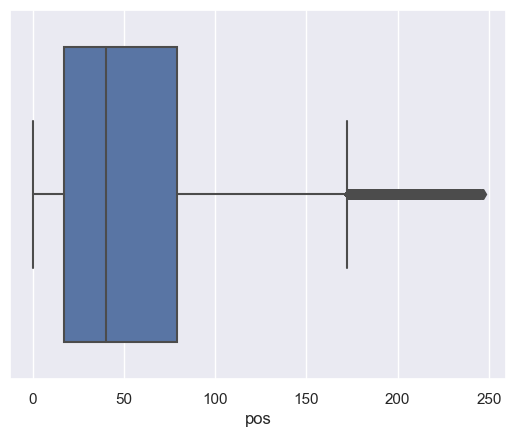

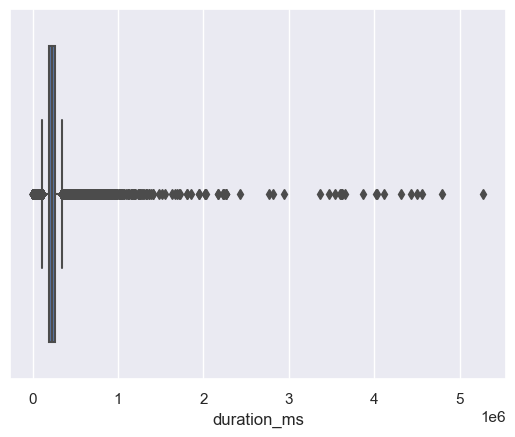

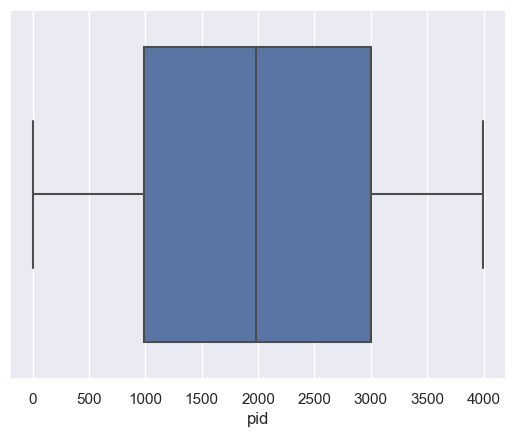

Distribution Analysis - Histogram


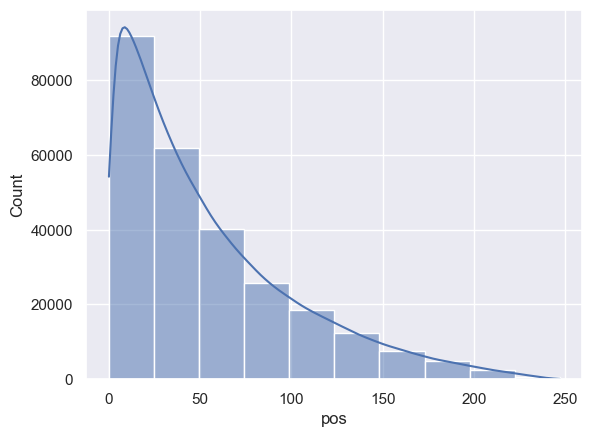

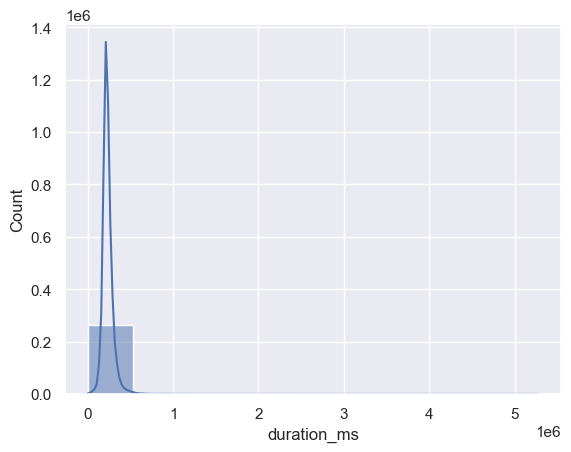

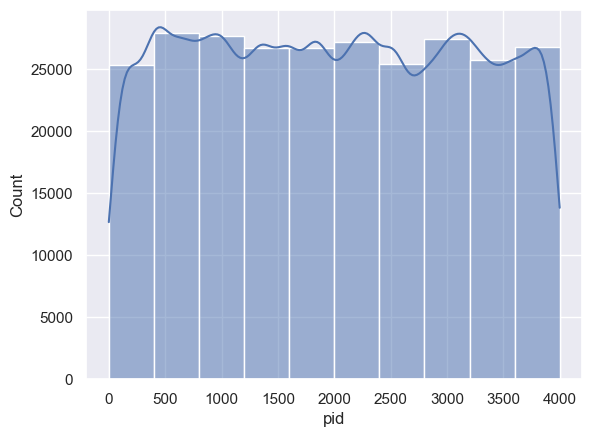

In [ ]:
#Analisis de numericas 
eda_num(train_dataframe_standandar)

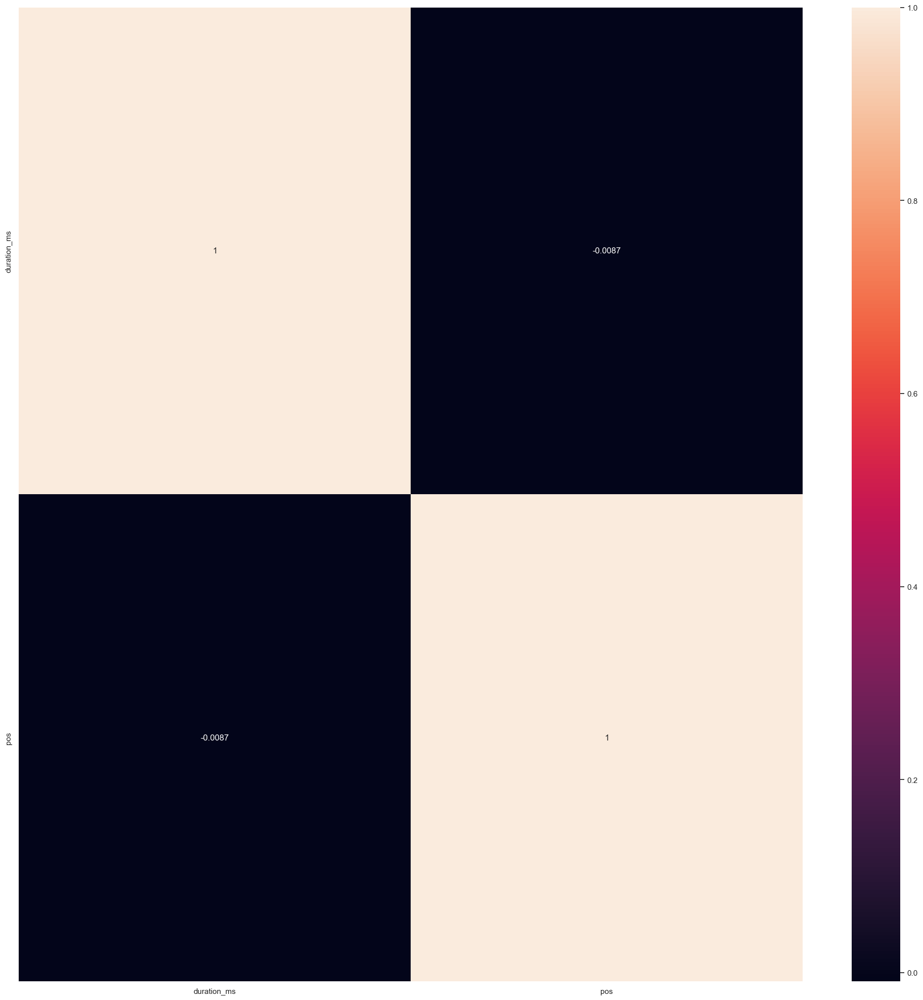

In [ ]:
data_numerica = train_clean_df[['duration_ms', 'pos']].copy()

# se coloca una tamaño a la figura
sns.set(rc={'figure.figsize':(25,25)})
sns.heatmap(data_numerica.corr(), annot=True)
plt.show()

In [ ]:
data_numerica.corr()

,duration_ms,pos
duration_ms,1.000000,-0.008707
pos,-0.008707,1.000000


In [ ]:
# creamos nuestro objeto de clase standardscalesr y lo ajustamos a los datos
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(data_numerica)

StandardScaler()

In [ ]:
scaler_data = scaler.transform(data_numerica)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(scaler_data)

PCA(n_components=2)

In [ ]:
x_pca = pca.transform(scaler_data)
scaler_data.shape

(266386, 2)

In [ ]:
x_pca.shape

(266386, 2)

/Users/sebastiangarcia/Documents/GitHub/Proyecto-2-Data-Science/env/lib/python3.9/site-packages/matplotlib/text.py:1223: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



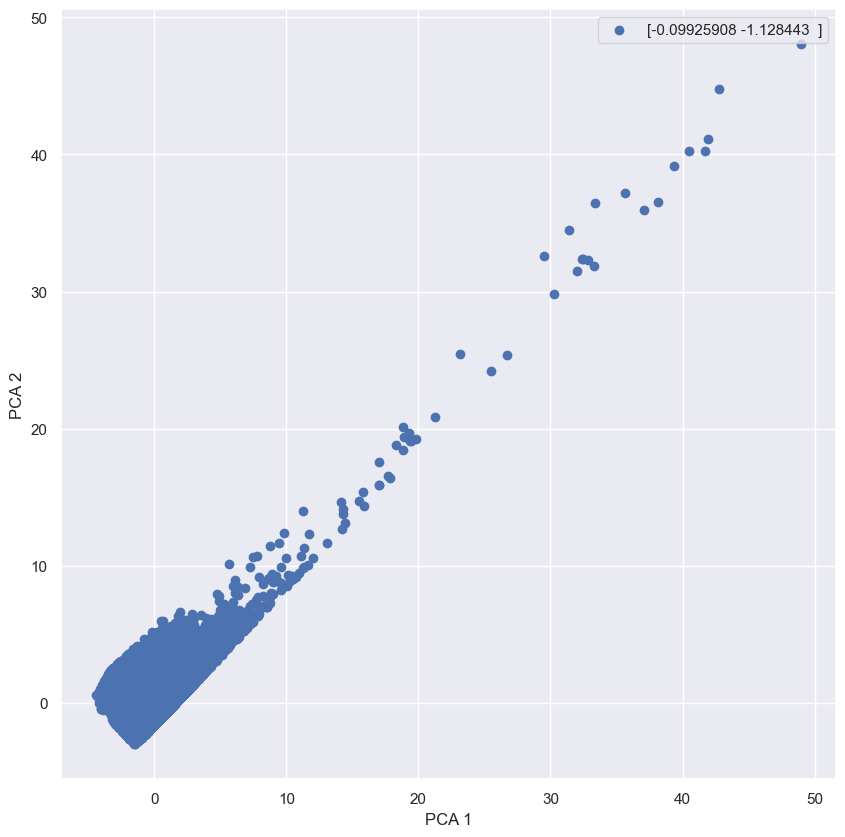

In [ ]:
from matplotlib import pyplot as plt

# scaler_data
plt.figure(figsize=(10,10))
plt.scatter(x_pca[:,0], x_pca[:,1])
plt.legend(scaler_data, loc='upper right')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
data_categorica = train_clean_df[['artist_name', 'track_name', 'album_name']].copy()
data_categorica

,artist_name,track_name,album_name
0,missy elliott,lose control feat ciara fat man scoop,the cookbook
1,britney spears,toxic,in the zone
2,beyoncé,crazy in love,dangerously in love alben für die ewigkeit
3,justin timberlake,rock your body,justified
4,shaggy,it wasnt me,hot shot
...,...,...,...
266381,alanis morissette,uninvited,the collection
266382,alanis morissette,you learn 2015 remastered,jagged little pill remastered
266383,alanis morissette,hands clean,under rug swept
266384,andrew mcmahon in the wilderness,cecilia and the satellite,andrew mcmahon in the wilderness


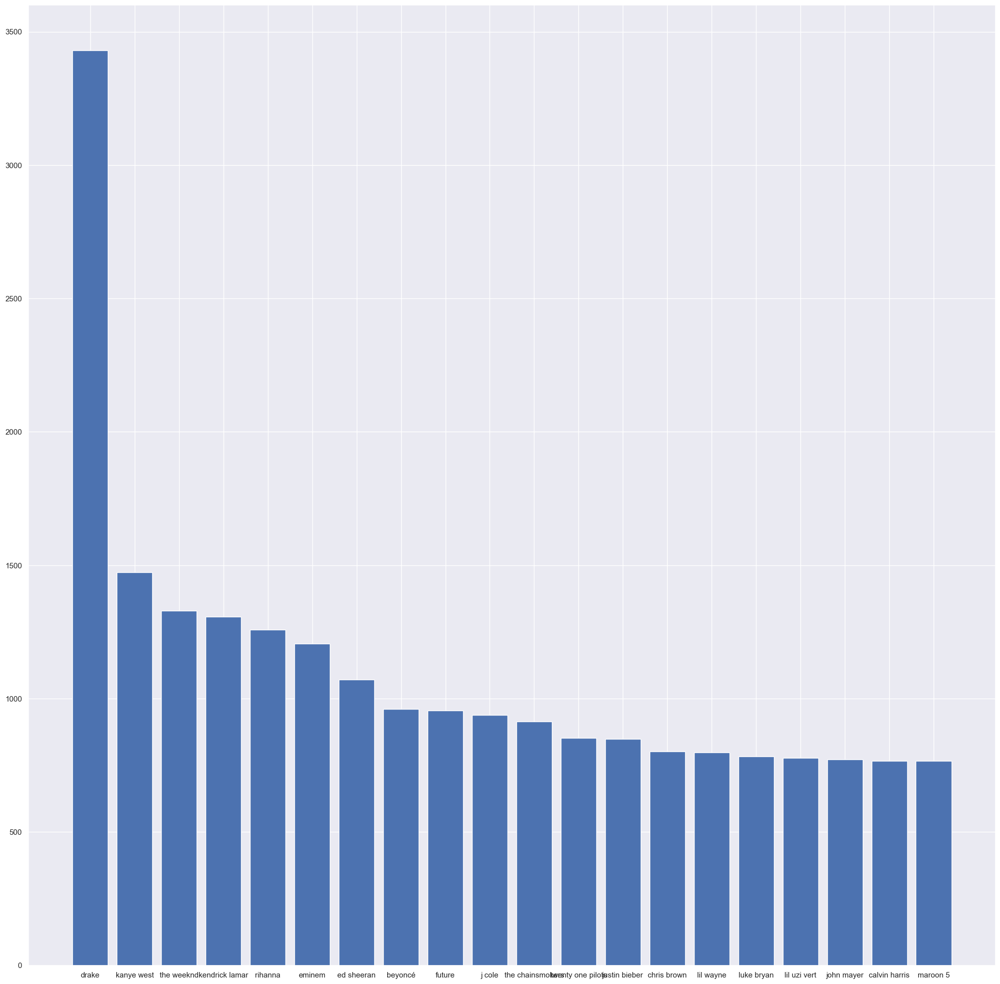

In [ ]:
artist_names = train_clean_df['artist_name'].value_counts().keys()[:20]
songs = train_clean_df['artist_name'].value_counts().values[:20]

plt.bar(artist_names, songs)
plt.show()

In [ ]:
artist_names_counts = train_clean_df['artist_name'].value_counts()[:30]
artist_names_counts

drake                   3429
kanye west              1473
the weeknd              1329
kendrick lamar          1307
rihanna                 1258
eminem                  1206
ed sheeran              1071
beyoncé                  961
future                   956
j cole                   938
the chainsmokers         914
twenty one pilots        852
justin bieber            849
chris brown              802
lil wayne                798
luke bryan               784
lil uzi vert             778
john mayer               773
calvin harris            767
maroon 5                 766
post malone              765
big sean                 761
florida georgia line     758
bruno mars               713
kenny chesney            702
coldplay                 701
geazy                    693
the beatles              691
zac brown band           680
childish gambino         676
Name: artist_name, dtype: int64

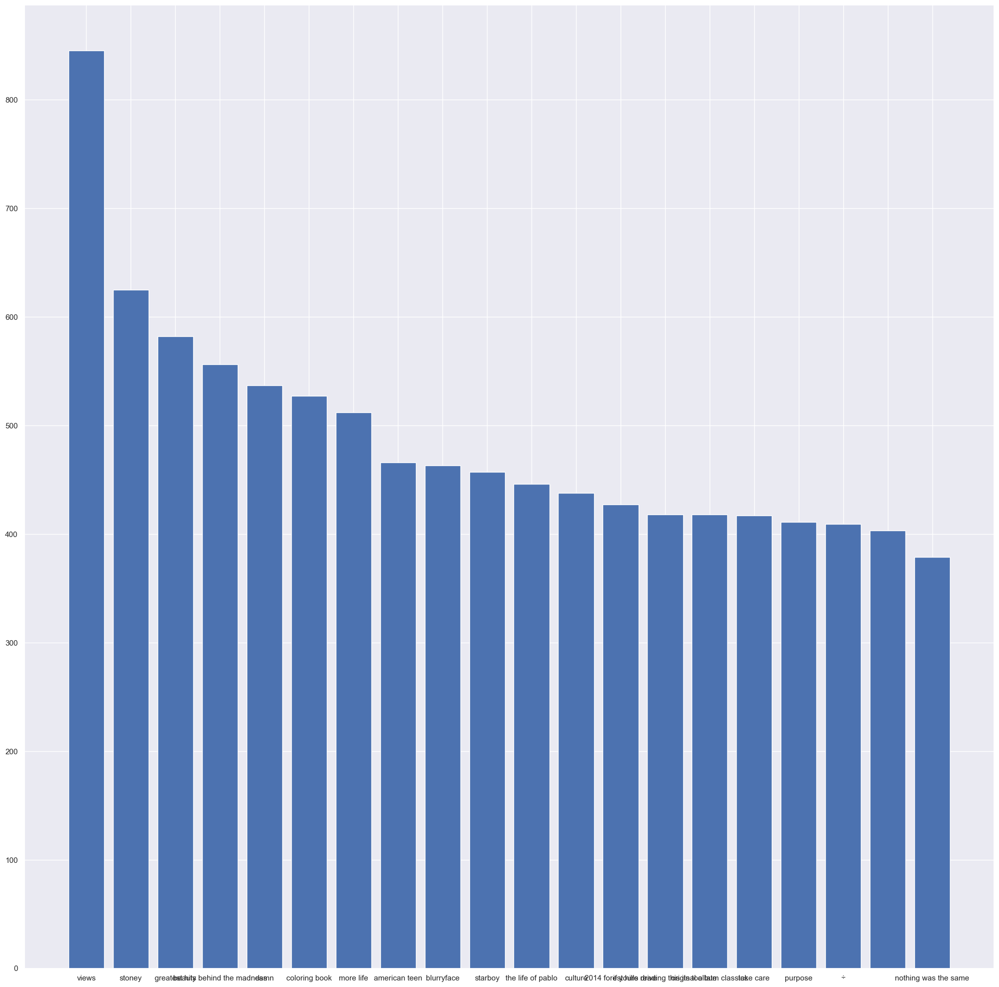

In [ ]:
album_name = train_clean_df['album_name'].value_counts().keys()[:20]
songs = train_clean_df['album_name'].value_counts().values[:20]

plt.bar(album_name, songs)
plt.show()

In [ ]:
album_names_counts = train_clean_df['album_name'].value_counts()[:30]
album_names_counts

views                                 845
stoney                                625
greatest hits                         582
beauty behind the madness             556
damn                                  537
coloring book                         527
more life                             512
american teen                         466
blurryface                            463
starboy                               457
the life of pablo                     446
culture                               438
2014 forest hills drive               427
if youre reading this its too late    418
original album classics               418
take care                             417
purpose                               411
÷                                     409
                                      403
nothing was the same                  379
x                                     377
montevallo                            376
anti                                  356
fetty wap                         

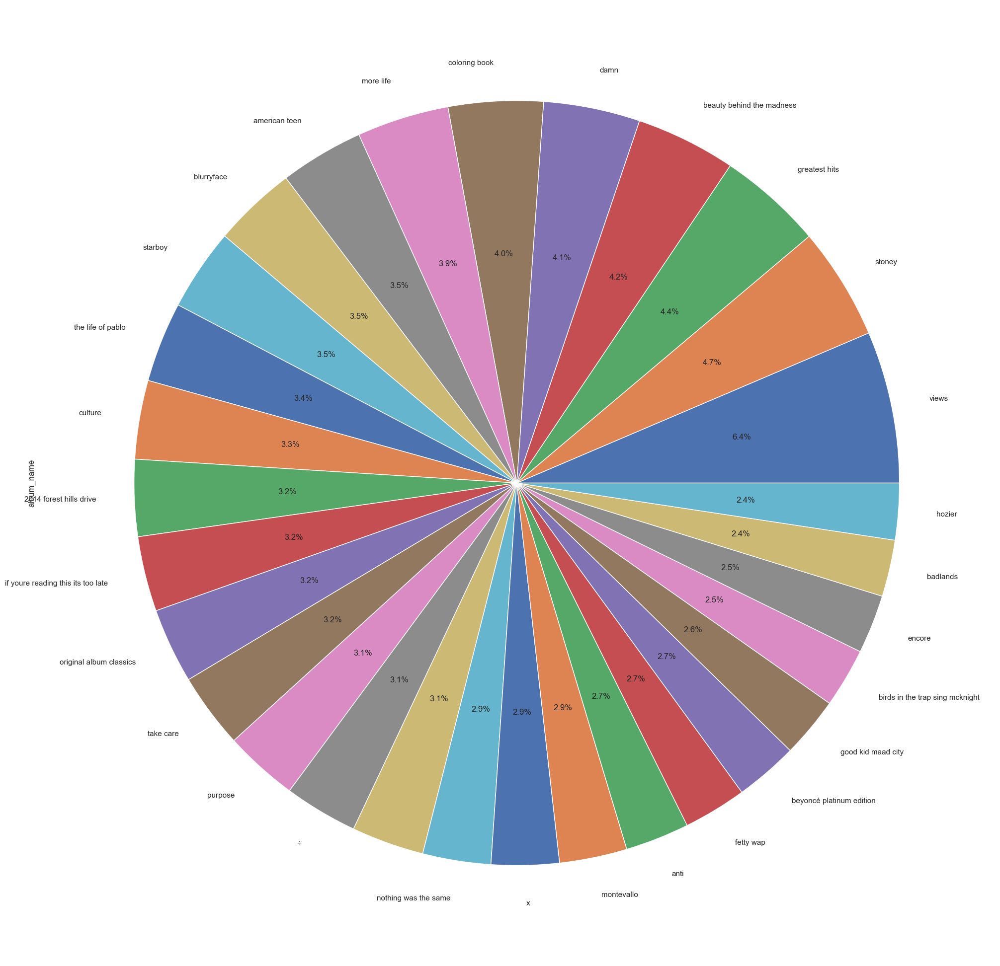

In [ ]:
train_clean_df['album_name'].value_counts()[:30].plot.pie(autopct='%1.1f%%')
plt.show()

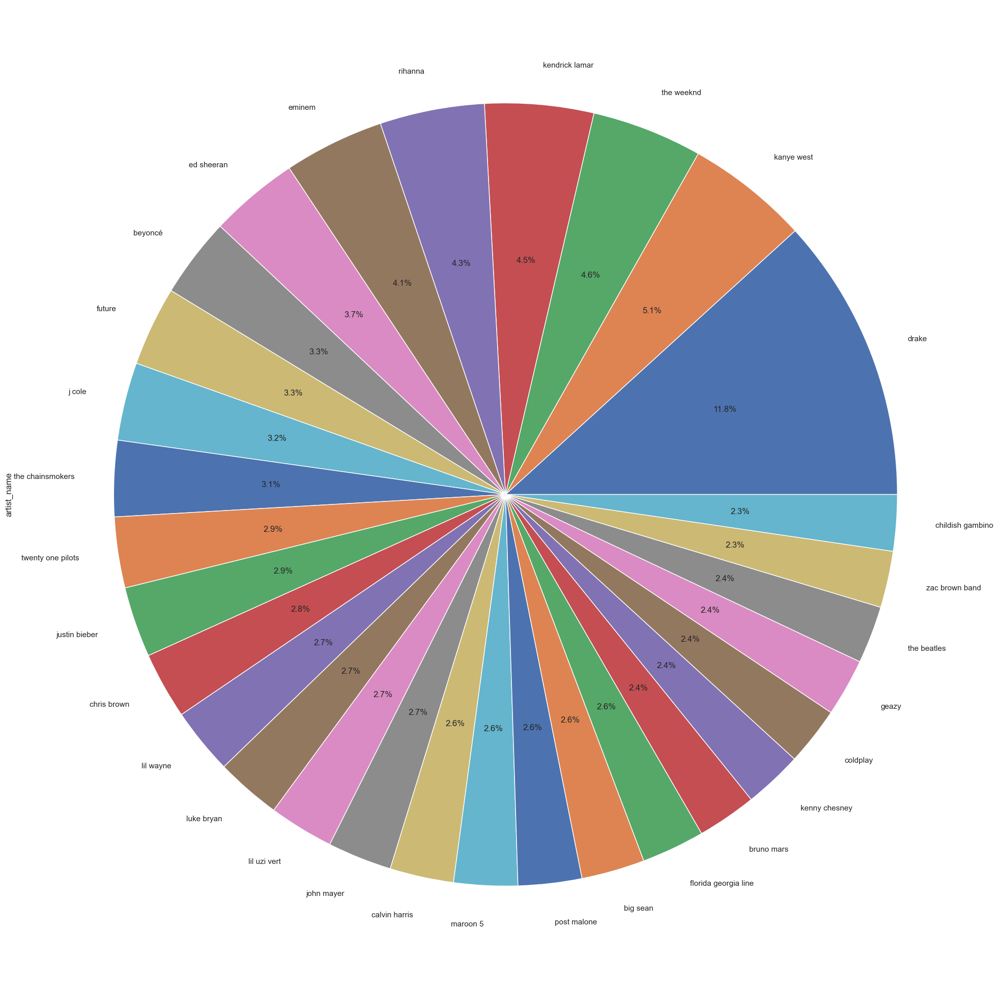

In [ ]:
train_clean_df['artist_name'].value_counts()[:30].plot.pie(autopct='%1.1f%%')
plt.show()

Simulacion de recomendacion colaborativa

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd

def get_interactions(tracks, pid):
    #Se obtiene los ids de las tracks que estan en la playlist
    favorite_tracks_ids = tracks[tracks['pid'] == pid]['track_id']
    #Se obtiene la info de esas canciones
    interacted_tracks = tracks[tracks['pid'] == pid]
    #Se obtiene las que no han interactuado en la playlist
    non_interacted_tracks = tracks[~tracks['track_id'].isin(favorite_tracks_ids)]

    interacted_tracks = interacted_tracks.drop_duplicates(subset='track_id',keep="first").reset_index()
    non_interacted_tracks = non_interacted_tracks.drop_duplicates(subset = 'track_id',keep="first").reset_index()


    return interacted_tracks, non_interacted_tracks

def format_results(n,len_test,hits5,hits10,pid):
    #Calcular recall 5 y 10
    recall5 = hits5/len_test
    recall10 = hits10/len_test

    return {'n': n, 'recall5': recall5, 'recall10': recall10, 'hits5': hits5, 'hits10': hits10, 'pid': pid, 'count': len_test}

def get_hits_results(test,no_interacted,recomendations,n=100, seed=60):
    #Hacer loop en test para evaluar 
    hits5 = 0
    hits10 = 0

    for i in range(len(test)):
        #Se toma una muestra de las que no interactuaron
        sample_no_present = no_interacted.sample(n=n, random_state=seed)
        #Get the track id of the i element in test 
        track_id = test.iloc[i]['track_id']
        evaluation_ids = sample_no_present['track_id'].tolist()
        evaluation_ids.extend([track_id])

        #Se obtiene las canciones que si estan en los ids
        recommendations_present = recomendations[recomendations['track_id'].isin(evaluation_ids)]

        if test.iloc[i]['track_id'] in recommendations_present['track_id'][:5].tolist():
            hits5 += 1
        if test.iloc[i]['track_id'] in recommendations_present['track_id'][:10].tolist():
            hits10 += 1
    
    return hits5,hits10

def get_metrics_rec_model_for_playlist(songs_dataframe,rec_model, pid, n=100, seed=60):
    
    hits5, hits10 = 0, 0
    #Del dataframe se obtiene las que no han interactuado y las que si con el playlist id es curso
    tracks_present_df, no_present_track_df = get_interactions(songs_dataframe, pid)
    
    #Se divide las que interactuaron en train y test para evaluar la eficiencia
    train, test = train_test_split(tracks_present_df, test_size=0.2, random_state=seed)
    
    #Se recomienda para el playlist id en curso 
    df_recomendations = rec_model.make_recommendation(pid)

    #Se obtiene los hits
    hits5, hits10 = get_hits_results(test,no_present_track_df,df_recomendations)

    #Append results 
    return format_results(n,len(test),hits5,hits10,pid)


#Obtiene las metricas en general de toda la evaluacion
def get_global_results(detailed_playlists_metrics, rec_model):
    #Obtener el total de conteo
    total_count = detailed_playlists_metrics['count'].sum()
    global_recall_at_5 = detailed_playlists_metrics['hits5'].sum() / total_count
    global_recall_at_10 = detailed_playlists_metrics['hits10'].sum() / total_count

    #Retornar string con resultados, nombre de rec_modelo , recall 5 y 10
    return 'rec_model: ' + rec_model.rec_model_name + ' Recall5: ' + str(global_recall_at_5) + ' Recall10: ' + str(global_recall_at_10)

#https://stackoverflow.com/questions/28056171/how-to-build-and-fill-pandas-dataframe-from-for-loop
def get_metrics_rec_model(songs_dataframe,rec_model, n=100, seed=60):
    temporal = []
    for pid in songs_dataframe['pid'].unique():
        evaluation_results = get_metrics_rec_model_for_playlist(songs_dataframe,rec_model, pid, n=n, seed=seed)
        temporal.append(evaluation_results)
        
    #Sort results according to count 
    evaluation_results = pd.DataFrame(temporal).sort_values('count',ascending=False)

    general_rec_model_metrics = get_global_results(evaluation_results, rec_model)
    
    return general_rec_model_metrics, evaluation_results

class CF_Rec:

    def __init__(self, factorization_matrix_df):
        self.factorization_matrix_df = factorization_matrix_df
        self.rec_model_name = 'Collaborative Filtering Recommendation'

    def make_recommendation(self, pid, ids_to_ignore=None):
        if ids_to_ignore is None:
            ids_to_ignore = []
        sorted_playlist_predictions = self.factorization_matrix_df[pid].sort_values(ascending=False).reset_index()

        sorted_playlist_predictions = sorted_playlist_predictions.rename(columns={pid: 'rec_punctuation'})

        return sorted_playlist_predictions[~sorted_playlist_predictions['track_id'].isin(ids_to_ignore)].drop_duplicates(subset='track_id', keep="first").reset_index().sort_values('rec_punctuation', ascending=False)

In [ ]:
#save pid and name of the playlist
pid = train_dataset['pid']
name = train_dataset['name']
followers = train_dataset['num_followers']
playlist_df = pd.DataFrame({'pid': pid, 'playlist_name': name, 'playlist_followers': followers})
playlist_df.head(50)

,pid,playlist_name,playlist_followers
0,0,Throwbacks,1
1,1,Awesome Playlist,1
2,2,korean,1
3,3,mat,1
4,4,90s,2
5,5,Wedding,1
6,6,I Put A Spell On You,1
7,7,2017,1
8,8,BOP,2
9,9,old country,1


Obtener interacciones con la playlist deseada

In [ ]:
#get songs where pid is elected
interacted_tracks, non_interacted_tracks=get_interactions(train_clean_df, 12)
#Get track name , pid and artist head
interacted_tracks[['track_name', 'pid', 'artist_name']].head(50)


,track_name,pid,artist_name
0,new soul,12,yael naim
1,let her go,12,passenger
2,stolen dance,12,milky chance
3,i know theres gonna be good times feat popcaan,12,young thug
4,hold back the river,12,james bay
5,are you with me radio edit,12,lost frequencies
6,so high feat ghost loft,12,wiz khalifa
7,its not unusual,12,tom jones
8,scars to your beautiful,12,alessia cara


Armando la matriz de factorizacion

In [ ]:
#https://beckernick.github.io/matrix-factorization-recommender/
train_clean_df['event_strength'] = 1
#Crear la matriz con pid como row y cancion como column, con pivot tira error por las rows duplicadas
#factorization_matrix = train_clean_df.pivot(index='pid', columns='track_id', values='event_strength').fillna(0)
factorization_matrix = train_clean_df.pivot_table(index='pid',columns='track_id',values='event_strength',aggfunc='sum',).fillna(0)

factorization_matrix.head()

track_id,awolnation remixawolnation awolnation remix,from sing original motion picture soundtrackbunniessing,kulkid remixfyferemixes ep,1 radio editmartin solveig 1,a feeling radio editirene carawhat a feelin,a feeling remixirene carathe casablanca records story,a lifenoel gallaghers high flying birdsnoel gallaghers high flying birds,addictive intro feat charlene tweet keysmissy elliottmiss addictive,baby one more timetove styrke baby one more time,be lovedpapa roachthe paramour sessions,...,잘못된 만남kim gun mo김건모 3집 잘못된 만남,전야 前夜 the eveexothe war the 4th album,좋아 she isjonghyunshe is the 1st album,주문 mirotictvxqtvxq the 4th world tour catch me live album,중독 overdoseexokthe 2nd mini album 중독 overdose,쿠데타 coup detatgdragoncoup detat,투명 우산 don’t let me goshinee1 of 1 the 5th album,팝콘sung sikyungdouble life the other side,헤어지지 못하는 여자 떠나가지 못하는 남자 cant breakup girl cant breakaway boy feat 정인 jung inleessanghexagonal,환생 rebirthred velvet환생 rebirth
pid,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#https://www.w3schools.com/python/scipy/scipy_sparse_data.php
#https://www.educative.io/answers/sparse-matrices-in-python
#Crear la sparse matrix para svds
sparse_matrix = csr_matrix(factorization_matrix.values)
# Performs matrix factorisation of the original user item matrix
u, sigma, vt = svds(sparse_matrix, k = 30)  # k is number of factors
sigma = np.diag(sigma) #para hacerla diagonal
print(u.shape, vt.shape, sigma.shape)

(4000, 30) (30, 93014) (30, 30)


In [ ]:
print(u)
print(vt)

[[-1.85562654e-03 -2.08634421e-03  4.03230553e-03 ...  2.04564195e-02
   2.48016750e-03 -1.10528344e-02]
 [-1.71294320e-04 -2.90957837e-03  5.95118224e-04 ...  1.81738509e-02
   4.53550811e-03 -2.55074793e-03]
 [ 1.09460137e-03 -3.36425087e-05 -5.14765640e-04 ...  6.99529008e-05
   2.12516706e-06 -5.18167914e-05]
 ...
 [-2.21548590e-03 -2.72834337e-04  5.02588290e-03 ...  7.84480186e-04
   1.56149511e-05 -1.04969375e-03]
 [-3.08994155e-02  4.09756668e-04  2.62135901e-02 ... -5.05375335e-02
  -2.29729111e-02 -6.73983438e-02]
 [ 4.85783796e-04 -2.66233383e-02 -4.87561202e-04 ...  2.05417591e-02
   4.93824535e-03 -7.14635228e-03]]
[[-3.01625361e-04  1.72031479e-04 -3.63473203e-05 ...  7.49111245e-06
   4.83111984e-06  1.92544602e-04]
 [-6.26653165e-04 -3.40291313e-04 -4.52008057e-06 ... -5.23402029e-07
  -3.26912236e-07 -9.57473691e-06]
 [ 1.05710530e-03 -2.75777159e-05  5.33998161e-05 ... -2.37344889e-06
  -2.75774396e-06 -9.76144087e-05]
 ...
 [ 1.72766583e-04  7.78549789e-05  2.6664334

In [ ]:
predicted_playlist_evaluations = np.dot(np.dot(u, sigma), vt) 

#Normalizar los valores
playlist_predicted_ratings_norm = (predicted_playlist_evaluations - predicted_playlist_evaluations.min()) / (predicted_playlist_evaluations.max() - predicted_playlist_evaluations.min())
playlist_predicted_ratings_norm

array([[0.25164645, 0.25157599, 0.25165303, ..., 0.25163821, 0.25163872,
        0.25162561],
       [0.25164208, 0.25163163, 0.25163908, ..., 0.25163913, 0.25163915,
        0.25164183],
       [0.25161336, 0.25164324, 0.25163814, ..., 0.25163924, 0.2516392 ,
        0.25164421],
       ...,
       [0.25191388, 0.25162774, 0.25164966, ..., 0.25163862, 0.25163865,
        0.25162433],
       [0.25121461, 0.25169238, 0.25162967, ..., 0.25164095, 0.25164122,
        0.25170884],
       [0.25179027, 0.25162343, 0.25162865, ..., 0.25163721, 0.25163782,
        0.25158316]])

In [ ]:
#Convertir a dataframe
factorization_matrix_df = pd.DataFrame(playlist_predicted_ratings_norm, columns = factorization_matrix.columns, index=factorization_matrix.index).transpose()
factorization_matrix_df.head()

pid,0,1,2,3,4,5,6,7,8,9,...,3990,3991,3992,3993,3994,3995,3996,3997,3998,3999
track_id,,,,,,,,,,,,,,,,,,,,,
awolnation remixawolnation awolnation remix,0.251646,0.251642,0.251613,0.251597,0.251674,0.252057,0.251663,0.251833,0.251511,0.251652,...,0.251845,0.251668,0.251569,0.251639,0.251611,0.251648,0.252668,0.251914,0.251215,0.251790
from sing original motion picture soundtrackbunniessing,0.251576,0.251632,0.251643,0.251637,0.251642,0.251740,0.251634,0.251630,0.251637,0.251636,...,0.251674,0.251631,0.251638,0.251639,0.251623,0.251634,0.251684,0.251628,0.251692,0.251623
kulkid remixfyferemixes ep,0.251653,0.251639,0.251638,0.251640,0.251637,0.251644,0.251641,0.251647,0.251639,0.251640,...,0.251638,0.251639,0.251637,0.251639,0.251640,0.251642,0.251663,0.251650,0.251630,0.251629
1 radio editmartin solveig 1,0.252045,0.251638,0.251627,0.251593,0.251696,0.251479,0.251624,0.251785,0.251559,0.251649,...,0.251547,0.251630,0.251537,0.251639,0.251542,0.251608,0.253696,0.251997,0.250799,0.251555
a feeling radio editirene carawhat a feelin,0.251558,0.253394,0.251634,0.251596,0.251679,0.251942,0.251549,0.251602,0.251133,0.251628,...,0.251757,0.251672,0.251583,0.251639,0.251409,0.251646,0.251364,0.251684,0.251760,0.251304


Usar el modelo de Collaborative Filtering

In [ ]:
collaborative_rec_model = CF_Rec(factorization_matrix_df)

In [ ]:
interacted_tracks_list = interacted_tracks['track_id'].tolist()
collaborative_rec_model_recommendations = collaborative_rec_model.make_recommendation(12, interacted_tracks_list)
print(collaborative_rec_model_recommendations.shape)

#Obtener la informacion completa del dataframe original sin dupliccados
tracks_df = train_clean_df[['track_id', 'track_name', 'artist_name']].drop_duplicates()
#Merge con el dataframe de recomendaciones
collaborative_rec_model_recommendations = collaborative_rec_model_recommendations.merge(tracks_df, how = 'left', left_on = 'track_id', right_on = 'track_id')[['rec_punctuation', 'track_id', 'track_name', 'artist_name']]

print(collaborative_rec_model_recommendations.shape)

(93005, 3)
(93005, 4)


In [ ]:
#Get count of different artist names 
collaborative_rec_model_recommendations.head(60)

,rec_punctuation,track_id,track_name,artist_name
0,0.267394,riptidevance joydream your life away,riptide,vance joy
1,0.263260,thinking out louded sheeranx,thinking out loud,ed sheeran
2,0.262874,opheliathe lumineerscleopatra,ophelia,the lumineers
3,0.262193,photographed sheeranx,photograph,ed sheeran
4,0.261747,lean on feat mø dj snakemajor lazerpeace is t...,lean on feat mø dj snake,major lazer
5,0.261348,skinny lovebon iverfor emma forever ago,skinny love,bon iver
6,0.260288,skinny lovebirdybirdy,skinny love,birdy
7,0.259907,take me to churchhozierhozier,take me to church,hozier
8,0.259901,how to save a lifethe frayhow to save a life,how to save a life,the fray
9,0.259855,all i wantkodalinein a perfect world,all i want,kodaline


Obtener metrica de recall y hits

In [ ]:
collaborative_rec_model_metrics, collaborative_rec_model_details = get_metrics_rec_model(train_clean_df,collaborative_rec_model)

print(collaborative_rec_model_metrics)
#Ordenar por recall 5
collaborative_rec_model_details.sort_values('recall5', ascending=False).head(50)

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:41: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:43: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:41: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-ba

rec_model: Collaborative Filtering Recommendation Recall5: 0.7351302486901335 Recall10: 0.827632647037119


/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:41: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:43: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.



,n,recall5,recall10,hits5,hits10,pid,count
3556,100,1.0,1.0,10,10,3556,10
2901,100,1.0,1.0,18,18,2901,18
297,100,1.0,1.0,17,17,297,17
2565,100,1.0,1.0,7,7,2565,7
2490,100,1.0,1.0,7,7,2490,7
1449,100,1.0,1.0,18,18,1449,18
1990,100,1.0,1.0,7,7,1990,7
2241,100,1.0,1.0,7,7,2241,7
2607,100,1.0,1.0,7,7,2607,7
1690,100,1.0,1.0,18,18,1690,18


Simulacion de recomendacion popularidad

In [ ]:
class PopularityRecommender:
  def __init__(self, tracks):
    self.tracks = tracks
    self.rec_model_name = 'Popularity Recommender'
  
  def make_recommendation(self, pid):
    pid_most_followers = playlist_df.sort_values('playlist_followers', ascending=False)['pid'].iloc[0]
    recommendations_df = self.tracks.loc[self.tracks['pid'] == pid_most_followers]

    return recommendations_df

In [ ]:
popularity_model = PopularityRecommender(train_clean_df)

In [ ]:
popularity_rec_model_metrics, popularity_rec_model_details = get_metrics_rec_model(train_clean_df, popularity_model)

print(popularity_rec_model_metrics)
#Ordenar por recall 5
popularity_rec_model_details.sort_values('recall5', ascending=False).head(50)

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:41: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:43: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.

/var/folders/q1/c6bggw2x74z5vcrx1tbn_7s00000gn/T/ipykernel_19875/2388324208.py:41: FutureWarning:

The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-ba

rec_model: Popularity Recommender Recall5: 0.0002029370526160431 Recall10: 0.0002029370526160431


,n,recall5,recall10,hits5,hits10,pid,count
2957,100,1.00000,1.00000,10,10,2957,10
357,100,0.03125,0.03125,1,1,357,32
3149,100,0.00000,0.00000,0,0,3149,50
716,100,0.00000,0.00000,0,0,716,7
758,100,0.00000,0.00000,0,0,758,7
1141,100,0.00000,0.00000,0,0,1141,7
3550,100,0.00000,0.00000,0,0,3550,7
1385,100,0.00000,0.00000,0,0,1385,7
2943,100,0.00000,0.00000,0,0,2943,7
3316,100,0.00000,0.00000,0,0,3316,7


Graficas

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
#Hits
models= ["Hits 5", "Hits 10"]
modelo1 = [popularity_rec_model_details['hits5'].sum(),popularity_rec_model_details['hits10'].sum()] 
modelo2 = [collaborative_rec_model_details['hits5'].sum(),collaborative_rec_model_details['hits10'].sum()] 

X_axis = np.arange(len(models))
# popularity_rec_model_details
# collaborative_rec_model_details

plt.bar(X_axis - 0.2, modelo1, 0.4, label = 'Popularity')
plt.bar(X_axis + 0.2, modelo2, 0.4, label = 'Collaborative')
  
plt.xticks(X_axis, models)
plt.xlabel("Hits")
plt.ylabel("Cantidad de hits")
plt.title("Comparacion de hits de modelos")
plt.legend()
plt.show()

NameError: name 'popularity_rec_model_details' is not defined

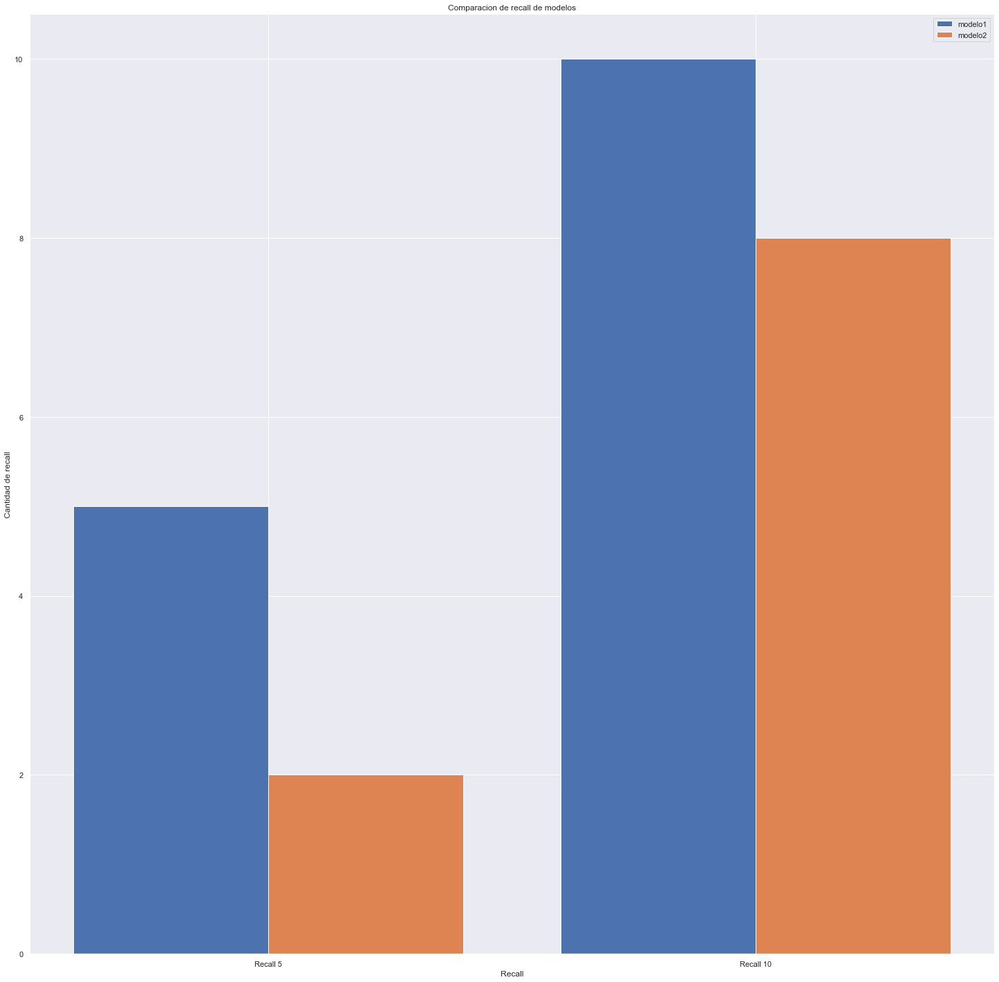

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
#Hits
models= ["Recall 5", "Recall 10"]

total_count = popularity_rec_model_details['count'].sum()
popularity_global_recall_at_5 = popularity_rec_model_details['hits5'].sum() / total_count
popularity_global_recall_at_10 = popularity_rec_model_details['hits10'].sum() / total_count

total_count = collaborative_rec_model_details['count'].sum()
collaborative_global_recall_at_5 = collaborative_rec_model_details['hits5'].sum() / total_count
collaborative_global_recall_at_10 = collaborative_rec_model_details['hits10'].sum() / total_count

modelo1 = [popularity_global_recall_at_5, popularity_global_recall_at_10] 
modelo2 = [collaborative_global_recall_at_5, collaborative_global_recall_at_10]

X_axis = np.arange(len(models))

plt.bar(X_axis - 0.2, modelo1, 0.4, label = 'Popularity')
plt.bar(X_axis + 0.2, modelo2, 0.4, label = 'Collaborative')
  
plt.xticks(X_axis, models)
plt.xlabel("Recall")
plt.ylabel("Cantidad de recall")
plt.title("Comparacion de recall de modelos")
plt.legend()
plt.show()